# Table of Contents
* [Numerical resolution of KdV equation using a Finite Volume method](#Numerical-resolution-of-KdV-equation-using-a-Finite-Volume-method)
	* [Model : Korteweg - de Vries (KdV) equation :](#Model-:-Korteweg---de-Vries-%28KdV%29-equation-:)
	* [First equation](#First-equation)
		* [Temporal discretization](#Temporal-discretization)
			* [Euler](#Euler)
			* [4th order Runge-Kutta](#4th-order-Runge-Kutta)
		* [Spatial discretization](#Spatial-discretization)
		* [Choice of the steps](#Choice-of-the-steps)
		* [Evaluation of the solution on cell interfaces : resolution of the Riemann problem](#Evaluation-of-the-solution-on-cell-interfaces-:-resolution-of-the-Riemann-problem)
	* [Second equation](#Second-equation)
	* [Model functions](#Model-functions)
* [Scale analysis](#Scale-analysis)
	* [Characterization of non linearity](#Characterization-of-non-linearity)
	* [Characterization of dispersion](#Characterization-of-dispersion)
	* [Choice of the wavelength](#Choice-of-the-wavelength)
		* [Choice of the wave amplitude](#Choice-of-the-wave-amplitude)
		* [The criteria](#The-criteria)
		* [Simulations using the criteria](#Simulations-using-the-criteria)
			* [First simulations : Scott's examples](#First-simulations-:-Scott's-examples)
			* [More simulations : valid waves according to te criteria](#More-simulations-:-valid-waves-according-to-te-criteria)
	* [Comparison of domains](#Comparison-of-domains)
		* [First case](#First-case)
		* [Second case](#Second-case)
		* [Third case](#Third-case)
		* [Plot (all cases)](#Plot-%28all-cases%29)
		* [Plot (difference between first and third cases)](#Plot-%28difference-between-first-and-third-cases%29)


# Numerical resolution of KdV equation using a Finite Volume method

## Model : Korteweg - de Vries (KdV) equation :

We will compute an approximate solution to the KdV equation (according to the formulation presented by <a name="ref-1"/>[(T.B.Benjamin, 1972)](#cite-BBM)), which models a wave propagation accounting for nonlinear and dispersive effects \cite{BBM}: 

\begin{equation}
\begin{cases}
    u_t + au_x + b(u^2)_x + u_{xxx} = 0 \ , \ \ x \in [x_{min},x_{max}], \ \ t \in [0, t_{max}] \\
    u(x,0) = \Phi(x)
\end{cases}
\end{equation}

The constant coefficients $a$ and $b$ were introduced in order to analyze the influence of the phenomena acting in the model (pure advrection, nonlinearity and diffusion).

The kdV equation will be split in two equations, leading to the resolution of the following problem in each time step: 

\begin{equation}
\begin{cases}
    v_t + av_x + b(v^2)_x = 0 \ \ ,\ t \in [t_n,t_{n+1}], \  v(t_n) = u(t_n) \\
    w_t + w_{xxx} = 0 \ \ , \ t \in [t_n,t_{n+1}], \  w(t_n) = v(t_{n+1}) \\
    u(t_{n+1}) = v(t_{n+1})
\end{cases}
\end{equation}

## First equation

$ v_t + f(v)_x = 0, \ \ f(v) = av + bv^2 $

### Temporal discretization

#### Euler

$v_i^{n+1} = v_i^n - \Delta t  \  f(v_i^n)_x$

#### 4th order Runge-Kutta

\begin{equation}
\begin{cases}
k_1 = - f(v_i^n)_x \\
k_2 = - f\left(v_i^n + k_1\frac{\Delta t }{2}\right)_x \\
k_3 = - f\left(v_i^n + k_2\frac{\Delta t }{2}\right)_x \\
k_4 = - f(v_i^n + k_3 \Delta t)_x \\
v_i^{n+1} = v_i^n + \frac{\Delta t}{6}(k_1 + 2k_2 + 2k_3 + k_4)
\end{cases}
\end{equation}

### Spatial discretization

$ f(v_i^n)_x = \frac{f\left(v_{i+1/2}^n\right) - f\left(v_{i-1/2}^n\right)}{\Delta x}$

### Choice of the steps

In the non-conservative form, the equation is written as

$v_t +  (1+2v)v_x = 0$

which configures an advection problem with velocity $1+2v$

The space and time steps must verify the CFL condition : 

$(a+2bv)\frac{\Delta t}{\Delta x} \leq 1$

in order to avoid non-physical behaviors (e.g. mass increasing). Therefor, for each time step, we will chose, for small $\epsilon$

$\Delta t = \frac{\Delta x}{a+2b\max\limits_{x}|v|} - \epsilon$

### Evaluation of the solution on cell interfaces : resolution of the Riemann problem

In each interface between two cells of the discrete domain, the following Riemann problem will be solved :

\begin{equation}
\begin{cases}
v_t + f(v)_x = 0 \\
v(x,0) = v^- \ , \ x < 0 \\
v(x,0) = v^+ \ , \ x > 0
\end{cases}
\end{equation}

where the boundary is located at $x=0$ and $v^-$ and $v^+$ are the solutions in its two neighbor cells.

The flux function $f$ is uniformly convex, so the Riemann problem has a unique weak, admissible solution : \cite{ConservationLaws}

* If $v^- > v^+$  (shock) : 
\begin{equation}
v(x,t) = 
\begin{cases}
v^- \ ,\ \   f(v^-) > f(v^+) \\
v^+ \ ,\ \ f(v^-) < f(v^+)
\end{cases}
\end{equation}

* If $v^+ > v^-$  (rarefaction wave) :
\begin{equation}
v(x,t) = 
\begin{cases}
v^- \ ,\ \ f'(v^-) > 0 \\
\left(f'\right)^{-1}(v) \ ,\ \ f'(v^-) < 0 < f'(v^+) \\
v^+ \ ,\ \ f'(v^+) < 0 
\end{cases}
\end{equation}

## Second equation

The second equation will be solved using the Fourier method. Let $\hat{w}(k,t_n)$ be the Fourier coefficients of $w(x,t_n)$.  The Fourier transform of the equation

$w_t+w_{xxx}=0$

gives

$(\hat{w})_t(k,t) - ik^3\hat{w}(k,t)$ = 0

It is an ODE in $t$ which solution is
$\hat{w}(k,t) = e^{ik^3(t-t_n)}\hat{w}(k,t_n)$

The inverse Fourier transform using the coefficients $\hat{w}(k,t_{n+1})$ gives $w(x,t_{n+1})$

## Model functions

In [31]:
%%writefile kdv.py

import numpy as np
def Flux(u,a,b):
    return a*u + b*u*u
def Fluxder(u,a,b):
    return a + 2.0*b*u
def Fluxderinv(u,a,b):
    return (u-1.*a)/(2.*b)

Overwriting kdv.py


In [32]:
%%writefile kdv.py -a

def Riemann(u,x,t,a,b):
    uint = np.zeros_like(x)
    for  i in range(0,x.size-1):
        #incl = x[i]/t
        incl = 0
        um = u[i]
        up = u[i+1]
        if um == up :
            uint[i] = um
        elif  um > up:
            sigma = (Flux(um,a,b) - Flux(up,a,b))/(um-up)
            if incl < sigma:
                uint[i] = um
            else:
                uint[i] = up
        else:
            if incl < Fluxder(um,a,b) :
                uint[i] = um
            elif incl > Fluxder(up,a,b) :
                uint[i] = up
            else:
                uint[i] = Fluxderinv(incl,a,b)
    #uint[0] = u[0]
    uint[x.size-1] = u[x.size-1]
    return uint

Appending to kdv.py


In [33]:
%%writefile kdv.py -a

def Euler(u,dx,dt,periodic):
    umm = np.roll(u,1)
    if periodic :
        umm[0] = u[u.size-1]
    else :
        umm[0] = u[0]
    
    f = Flux(u)
    fmm = Flux(umm)
    
    u2 = u - dt/dx*(f-fmm)
    
    return u2

Appending to kdv.py


In [34]:
%%writefile kdv.py -a

def getRKCoef(u,x,t,dx,dt,a,b,periodic):
    uint = Riemann(u,x,t,a,b)
    uintmm = np.roll(uint,1)
    if periodic :
        uintmm[0] = uintmm[u.size-1]
    else :
        uintmm[0] = u[0]
        uint[u.size-1] = u[u.size-1]
        
    f = Flux(uint,a,b)
    fmm = Flux(uintmm,a,b)
    return dt*(fmm-f)/dx
        
def RK4(u,x,t,dx,dt,a,b,periodic):
        
    k1 = getRKCoef(u,x,t,dx,dt,a,b,periodic)
    k2 = getRKCoef(u+k1/2,x,t,dx,dt,a,b,periodic)
    k3 = getRKCoef(u+k2/2,x,t,dx,dt,a,b,periodic)
    k4 = getRKCoef(u+k3,x,t,dx,dt,a,b,periodic)
    
    u2 = u + 1./6.*(k1+2*k2+2*k3+k4)
    
    return u2

Appending to kdv.py


In [35]:
%%writefile kdv.py -a

def FourierSolver(u,t,dt,dx):
    nx = u.size-1
    #f0 = 1/dx
    #freq = np.linspace(0,nx,nx+1)*f0/(nx+1)
    #freq[(nx+1)/2+1:nx+1] = -np.flipud( freq[1:(nx+1)/2+1])
    uhat = np.fft.fft(u)
    uhat = uhat*np.exp(dt*1.j*np.power(np.fft.fftfreq(uhat.size,d=dt),3))
    #uhat = uhat*np.exp(dt*1.j*np.power(freq,3))
    u2 = np.fft.ifft(uhat)
#    if not (np.all(np.isreal(u2))):
#        print(u2)
#        sys.exit("Error in Fourier method")
    return np.real(u2)

Appending to kdv.py


In [37]:
%%writefile kdv.py -a

import sys
import math


def IFD4Solver(u,t,dt,dx,BC):
    k = dt/(dx*dx*dx)

    nx = u.size - 1

    d0  = 1.*np.ones(nx+1)
    d1 = -k*13/8.*np.ones(nx)
    d2 = +k*np.ones(nx-1)
    d3 = -k*1./8.*np.ones(nx-2)
    
    M =  np.diag(d0) + np.diag(d1,1) + np.diag(d2,2) + np.diag(d3,3) - np.diag(d1,-1) - np.diag(d2,-2) - np.diag(d3,-3)
       
    vvv = np.zeros(nx+1)
    vvv[0] = 1. - 1.*k
    vvv[1] = 3.*k
    vvv[2] = -3.*k
    vvv[3] = 1.*k   
    ######vvv[0] = 1. - 49./8.*k
    ######vvv[1] = 29.*k
    ######vvv[2] = -461./8.*k
    ######vvv[3] = 62.*k
    ######vvv[4] = -307./8.*k
    ######vvv[5] = 13.*k
    ######vvv[6] = -15./8.*k
    
    zzz = -np.flipud(vvv)
    zzz[nx] = 1. + 1.*k
    ######zzz[nx] = 1. + 49./8.*k

    M[0,:] = vvv
    M[1,:] = np.roll(vvv,1)
    M[2,:] = np.roll(vvv,2)
    
    M[nx,:] = zzz
    M[nx-1,:] = np.roll(zzz,-1)
    M[nx-2,:] = np.roll(zzz,-2)
    

    rhs = np.copy(u)
    
    ### Boundary conditions
    ## Structure : BC=[u(left),ux(left),uxx(left),alpha*u(left) + beta*ux(right),
    ##                 u(right),ux(right),uxx(right),alpha*u(right) + beta*ux(right),
    ##                 alpha,beta] 
    cntBC = 0
    if not math.isnan(BC[0]) : # u L
        cntBC = cntBC+1
        M[0,:] = 0.
        M[0,0] = 1.
        rhs[0] = BC[0]
    if not math.isnan(BC[1]) : # ux L
        cntBC = cntBC+1
        row = 0
        if not math.isnan(BC[0]):
            row = row + 1
        M[row,:] = 0.
        M[row,0] = -1./dx
        M[row,1] = 1./dx
        rhs[row] = BC[1]
    if not math.isnan(BC[2]) : # uxx L
        cntBC = cntBC+1
        row = 0
        if not math.isnan(BC[0]):
            row = row + 1
        if not math.isnan(BC[1]):
            row = row + 1
        M[row,:] = 0.
        M[row,0] = 1./(dx*dx)
        M[row,1] = -2./(dx*dx)
        M[row,2] = 1./(dx*dx)
        rhs[row] = BC[2]
    if not math.isnan(BC[3]) : # Robin L
        cntBC = cntBC+1
        if not (math.isnan(BC[0]) and math.isnan(BC[1]) and math.isnan(BC[2])) :
            sys.exit("Error in left BC : Robin defined with Dirichlet and/or Neumann")
        M[0,:] = 0.
        M[0,0] = BC[8] - BC[9]/dx + BC[10]/(dx*dx)
        M[0,1] = BC[9]/dx  - 2.*BC[10]/(dx*dx)
        M[0,2] = BC[10]/(dx*dx)
        rhs[0] = BC[3]
    if not math.isnan(BC[4]) : # u R
        cntBC = cntBC+1
        M[nx,:] = 0.
        M[nx,nx] = 1.
        rhs[nx] = BC[4]
    if not math.isnan(BC[5]) : # ux R
        cntBC = cntBC+1
        row = nx
        if not math.isnan(BC[4]):
            row = row - 1
        M[row,:] = 0.
        M[row,nx] = 1./dx
        M[row,nx-1] = -1./dx
        rhs[row] = BC[5]
    if not math.isnan(BC[6]) : # uxx R
        cntBC = cntBC+1
        row = nx
        if not math.isnan(BC[4]):
            row = row - 1
        if not math.isnan(BC[5]):
            row = row - 1
        M[row,:] = 0.
        M[row,nx] = 1./(dx*dx)
        M[row,nx-1] = -2. /(dx*dx)  
        M[row,nx-2] = 1./(dx*dx)
        rhs[row] = BC[6]
    if not math.isnan(BC[7]) : # Robin R
        cntBC = cntBC+1
        if not (math.isnan(BC[4]) and math.isnan(BC[5]) and math.isnan(BC[6])) :
            sys.exit("Error in right BC : Robin defined with Dirichlet and/or Neumann")
        M[nx,:] = 0.
        M[nx,nx] = BC[8] + BC[9]/dx + BC[10]/(dx*dx)
        M[nx,nx-1] = -BC[9]/dx - 2.*BC[10]/(dx*dx)
        M[nx,nx-2] = BC[10]/(dx*dx)
        rhs[nx] = BC[7]

     
    if cntBC != 3 :
        print(cntBC)
        print(BC)
        sys.exit("Wrong number of BC")
        
    
    np.set_printoptions(threshold=np.nan)
    np.set_printoptions(suppress=True)
    
    u2 = np.linalg.solve(M,rhs)
    
    return u2

Appending to kdv.py


In [38]:
%%writefile kdv.py -a

def IFD4SolverMain(u,t,dt,dx,BC):
    k1 = IFD4Solver(u,t,dt,dx,BC) - u
    k2 = IFD4Solver(u+dt*k1/2.,t,dt,dx,BC) - (u+k1/2.)
    k3 = IFD4Solver(u+dt*k2/2.,t,dt,dx,BC) - (u+k2/2.)
    k4 = IFD4Solver(u+dt*k3,t,dt,dx,BC) - (u+k3)
    
    u2 = u + dt/6.*(k1 + 2.*k2 + 2.*k3 + k4)
    
    return u2

Appending to kdv.py


In [39]:
%%writefile kdv.py -a

def computeError(x,u,uref):
    
    nx = x.size-1
    niter = u.shape[1]
    
    ## Error in every point
    uerr = u - uref
    
    ## Norm of the error for each time step
    errNorm = np.linalg.norm(uerr,axis=0)
    
    ## Error in the right boundary
    errBoundary = uerr[nx,:]
    
    maxErrNorm = np.amax(np.absolute(errNorm))
    maxErrBoundary = np.amax(np.absolute(errBoundary))
        
    return uerr, errNorm, errBoundary, maxErrNorm, maxErrBoundary

Appending to kdv.py


In [40]:
%%writefile kdv.py -a

def runRk4FVFourier(x,u,t0,tmax,a,b,periodic=1, bc=None, constantBC = True, vardt = True):
    
    print("")
    print("*** Computing solution ...")
    t = t0
    tall = np.ones(1)*t0
    u0 = u
    uall = u
    u0min = np.amin(u)
    u0max = np.amax(u)
    dx = np.diff(x)[0]
    iter = 0
    eps = 1e-6

    ##### Parameters
    printstep = 5
    #a = 1
    #b = 1


    #if not periodic:
     #   A,B,C = computeChebMatrix(x,u)
    
    if not vardt :
        umax = np.amax(np.absolute(u))
        dt = dx/(1.*a+2*b*umax) - eps
    
    while t<tmax:
        iter = iter + 1
        
        if vardt:
            umax = np.amax(np.absolute(u))
            dt = dx/(1.*a+2*b*umax) - eps     # CFL CONDITION

        t = t+dt
        u = RK4(u,x,t,dx,dt,a,b,periodic)
        
        if periodic :
            u = FourierSolver(u,t,dt,dx)
        else :
            if constantBC :
                BC = bc
            else :
                BC = bc[iter-1,:]
            u = IFD4Solver(u,t,dt,dx,BC)
            ###u = ChebyshevSolver(x,u,dt,dx,A,B,C,cl)

        uall = np.column_stack((uall,u))
        tall = np.hstack((tall,t*np.ones(1)))
        
        if iter%100 == 0:
            print(iter,t)
            
    print("*** End of computation ***")
    return uall,tall


Appending to kdv.py


In [41]:
%%writefile kdv.py -a

def discretizeSpace(xmin,xmax,dx) :
    nx = int((xmax-xmin)/dx)
    x = np.linspace(xmin, xmax,nx+1)    
    return x

Appending to kdv.py


In [48]:
%%writefile kdv.py -a

import matplotlib.pyplot as plt
from matplotlib import animation
from JSAnimation import IPython_display
import kdv

def plotSolutionError(x,u,uerr,errNorm,errBoundary,tall,xmin,xmax,ymin,ymax):
    
    plt.plot(tall,errNorm,label=r'$e_1$')
    plt.legend(loc=(1,0))
    plt.plot(tall,errBoundary,label=r'$e_2$')
    plt.legend(loc=(1,0))
    plt.xlabel("t")
    
    print("*** Plotting animation ...")
    
    fig = plt.figure()
    ax = plt.axes(xlim=(xmin, xmax), ylim=(ymin, ymax))
    line1, = ax.plot([], [], lw=2, label="Solution")
    line2, = ax.plot([], [], lw=2, label=r'$u-u_{ref}$')
    ax.set_ylabel(r'$u$')
    title = ax.set_title(r'$t=0.0 s$')
    plt.legend()

    def init():
        line1.set_data([], [])
        line2.set_data([], [])
        return line1, line2

    def animate(i):
        line1.set_data(x, u[:,i])
        title.set_text('t=%.3f'%(tall[i]))
        line2.set_data(x, uerr[:,i])
        return line1,line2

    anim = animation.FuncAnimation(fig, animate, init_func=init,
                        frames=u.shape[-1], interval=300)
    
    #anim = kdv.plotAnimation(x,uerr,tall,xmin,xmax,ymin,ymax)
    
    return anim

Appending to kdv.py


In [49]:
%%writefile kdv.py -a

def showWaveInfo(A,wvl,B,eps,xmin,xmax,N) :
    
    h0min = 1.5*A/eps
    h0max = B*wvl/(2.*np.pi)
    h0 = 0.5*(h0min+h0max)
    alpha2 = h0*h0/6.

    print(r'*** Wave info : ***')
    print(r'Amplitude : %f' %A)
    print(r'Wavelength : %f' %wvl)
    print(r'1/(2.*Wavelength^2) : %f' %(1./(2.*wvl*wvl)))
    print(r'h0min : %f' %h0min)
    print(r'h0max : %f' %h0max)
    print(r'eps : %f' %eps)
    print(r'B : %f' %B)
    print(r'alpha^2 : %f' %alpha2)
    print(r'Space steps : %d' %N)

Appending to kdv.py


# Scale analysis

In order to correctly simulate the physical phenomena involved in the KdV equation, the initial solution must satisfy the assumptions made in the derivation of the model. Following this purpose, we perform an scale analysis following the arguments presented in the paper of BBM [ADD REFERENCE] which at the same time will be linked to the physical case of water surface waves of small amplitude. This analysis will allow us to derive a criteria for selecting the initial conditions of some example simulations. 


We will seek to write the KdV equation in the following dimensionless and scaled form, as described in BBM article ([BBM])
$$U_T + U_X + \frac{\epsilon}{2} (U^2)_X + \epsilon\alpha^2U_{XXX} = 0$$

and link it to the parameters involved in the model for surface water waves [Senthilkumar] in dimensional form

\begin{equation}
    u^*_{t^*} + c_0u^*_{x^*} + \frac{3}{4}\frac{c_0}{h_0}({u^*}^2)_{x^*} + \frac{1}{6}c_0h_0^2u^*_{x^*x^*x^*} = 0 
\end{equation}

where the $\cdot^*$ denotes the physical variables, $h_0$ the undisturbed water depth for flat bottom and $c_0 = \sqrt{gh_0}$  the long wave speed.

## Characterization of non linearity 

According to the paper of BBM (1971), nonlinearity is characterized by a parameter $\epsilon$ such that if characteristics are written in the form

$$ \frac{1}{c_0} \frac{dx}{dt} = 1+ bu$$

then one can choose an $\epsilon \ll 1$ such that $bu=\epsilon U$, with $U$ of order one. For the particular case of water waves this can be represented as

$$ \frac{1}{c_0} \frac{dx}{dt} = 1 + \frac{3}{2h_0}u$$

and thus $b = \frac{3}{2h_0}$. This parameter will be used in the next arguments.

## Characterization of dispersion

The characterization of the dispersion comes from the derivation of the KdV equation. According to BBM if the propagation of the wave follows a law of the form

$$ u^*_{t^*} + uu_x+(\mathcal{L} u^*)_{x^*} = 0$$


with $\mathcal{L}$ such that $$ \hat{\mathcal{L}u^*} = \frac{c(k)}{c_0} \hat{u^*}(k,t)$$ with $\hat \cdot$ the Fourier transform and $c(k)$ the phase celerity, which is equivalent to 

$$ \mathcal{L} u = \mathcal{F}^{-1}\left(\frac{c(k)}{c_0}\right) * u$$ 
where $\mathcal{F}^{-1}$ is the inverse Fourier transform operator, then new scaling based on the fact that for $\kappa$ suffiicently small, the wave speed $c(\kappa) = c_0 + c_0 \sum_{n=1}^{\infty}A_n\epsilon^n\kappa^{2n}$ can be approximated by $c(\kappa) = c_0(1-\kappa^2)$, which motivates replacing $x=\sqrt{\epsilon} X$, $t =c_0 \sqrt{\epsilon} T$, and $u = \frac{\epsilon}{ b} U$ to obtain the equivalent equation 

$$ U_T + \epsilon U U_x+(\mathcal{L}_{\epsilon} U)_{X} = 0$$
with $\mathcal{L}_\epsilon$ such that 

$$ \hat{\mathcal{L}_\epsilon U} = \frac{c(\epsilon^{1/2} K)}{c_0} \hat{U}(K,T)$$ 

with $K=\sqrt{\epsilon} k$, which after replacing the full series expansion of $c(k)$ leads to

\begin{align}
    \mathcal{L}_\epsilon U &=U +\sum_{n=1}^\infty (-1)^n A_n \epsilon^n \partial_X^{2n} U    
\end{align}

and if terms for $n\geq2$ are neglectable, which is the case for $\epsilon \ll 1 $ and if one supposes that all derivatives of $U$ are of the same order of magnitude, then one obtains that

\begin{align*}
    \mathcal{L}_\epsilon U &= U + A_n \epsilon \frac{\partial^2 U}{\partial x^2} \\
    &= U - \alpha^2 \epsilon \frac{\partial^2 U}{\partial x^2} \\
\end{align*}
with $\alpha^2 = - A_n$. Replacing in the scaled equation results in

$$U_T + U_X + \frac{\epsilon}{2} (U^2)_X + \epsilon\alpha^2U_{XXX} = 0$$

Applying the same scaling $x=\sqrt{\epsilon} X$, $t =c_0 \sqrt{\epsilon} T$, and $u = \frac{\epsilon}{ b} U$ to the physical equation leads to $$U_T + U_X + \frac{3\epsilon}{4b} (U^2)_X + \frac{h_0^2\epsilon}{6}U_{XXX} = 0$$
from where one concludes that $ \alpha^2 = \frac{h_0^2}{6} $

## Choice of the wavelength

A sufficient condition for the terms of order greater than 1 in the power series expansion of $\mathcal{L}_\epsilon$ to be neglectable is that those terms are also neglectable for $c(k)$, given that that all the derivatives of $U$ have an order of magnitude 1

A key point in the derivation of the KdV equation is to assure that the terms for the higher derivatives (for $n > 1$) are small enough to be neglected. Firstly, [BBM] assumes that all this derivatives have have an order of magnitude 1. Secondly, a sufficient condition for this is that those terms are also neglectable in the series expansion of $c(k)$. Thirdly, also accordingly to [BBM], the following form is applicable to surface waves : 

$c(\kappa) = c_0 \left(\frac{tanh(\kappa h_0)}{\kappa h_0}\right) = c_0 \left(1 - \frac{1}{6}(\kappa h_0)^2 + \frac{19}{360}(\kappa h_0)^2 + ... \right) $

from where we can see that we must choose $\kappa h_0 \ll 1$

Denoting $\lambda$ as the wavelength, and choosing a constant $B$ such that $\kappa h_0  =  B \ll 1$, it follows that $h_0 = \frac{B\lambda}{2\pi}$, and, from the relation $\alpha^2 = \frac{h_0^2}{6}$, we get $\alpha^2 = \frac{B^2\lambda^2}{6(2\pi)^2}$.

### Choice of the wave amplitude

From $bu^* = \epsilon U$, with $U$ of unit order magnitude, and since $b = \frac{3}{2h_0}$, the physical variable is written as $u^* = \frac{2}{3}h_0\epsilon U, \ (\epsilon > 0)$, thus if $\epsilon$ represents the amplitud of the wave, $\frac{2}{3}\epsilon h_0$ is the wave amplitude (as done in the scale study). Accordingly to [BBM], the nonlinearity in the KdV equation is valid for $\epsilon \ll 1$. Therefore, $\epsilon$ will be chosen taking in account this condition.

### The criteria

In resume, the proposed criteria to construct the initial data is : 

1. Adopt a water depth $h_0$ (e.g. from the data)
2. Choose a wave amplitude  $A = \frac{2}{3}h_0\epsilon$, then the restriction $\epsilon \ll 1$ translates to $\frac{A}{h_0} = \frac{2}{3}\epsilon \ll 1$.
3. Choose a wavelength $\lambda$ such that $\kappa h_0 = \frac{2\pi}{\lambda}h_0 = B \ll 1$, which translates to $\frac{h_0}{\lambda} = \frac{B}{2\pi} \ll 1$
4. The effect of dispersion over non linearity can be measured by taking the quotient of their coefficients $\frac{\epsilon \alpha^2}{\epsilon} = \alpha^2$.

From another point of view, one can define a wave of amplitude $A$ and wavelength $\lambda$ and compute the range of depths in which this initial condition is valid, for a given precision $(B,\epsilon)$ : $\left[\frac{3}{2}\frac{A}{\epsilon},\frac{B\lambda}{2\pi} \right]$. This is consistent with the fact that the KdV model is valid for waves with small amplitude and large wavelenght [BBM].

### Simulations using the criteria

The criteria described above was used to generate the initial solutions of the following simulations. These tests were based in those presented in http://www.bu.edu/pasi-tsunami/files/2013/01/day-1.pdf and http://www.bu.edu/pasi-tsunami/files/2013/01/daytwo12.pdf ; even if they have not used the same model, we can qualitatively compare the solution depending on the characteristics of the initial wave.

In [64]:
import numpy as np
import matplotlib.pyplot as plt
import kdv
import generalFunctions as gF

%matplotlib inline

nan = float('nan')

#### First simulations : Scott's examples

In [107]:
### Wave 1 (Scott example - very long wave)

eps = 0.001
B = 0.1
A = 0.0001
wvl = np.sqrt(.5/0.004)
L = 10*wvl
xmin = -L
xmax = 3*L
N = 500

dx = (xmax-xmin)/N
x = kdv.discretizeSpace(xmin,xmax,dx)

kdv.showWaveInfo(A,wvl,B,eps,xmin,xmax,N)
print (h0*h0/A/wvl)
u = np.zeros_like(x)
u = A*np.exp(-(x-0.)**2/(2.*wvl*wvl))
BC=np.array([0.,0.,nan,nan,nan,0.,nan,nan,1.,1000.,0.])
uall, tall = kdv.runRk4FVFourier(x,u,t0=0,tmax=100.,a=1,b=1, periodic = 0, bc=BC)

gF.plotAnimationNSolutions(1,x,np.array([uall]),tall,xmin,xmax,-2.*A,2.*A,[" "],r'$u$')
#gF.plotAnimation(x,uall,tall,xmin,xmax,-2.*A,2.*A)

*** Wave info : ***
Amplitude : 0.000100
Wavelength : 11.180340
1/(2.*Wavelength^2) : 0.004000
h0min : 0.150000
h0max : 0.177941
eps : 0.001000
B : 0.100000
alpha^2 : 0.004481
Space steps : 500
7.70167841348

*** Computing solution ...


KeyboardInterrupt: 

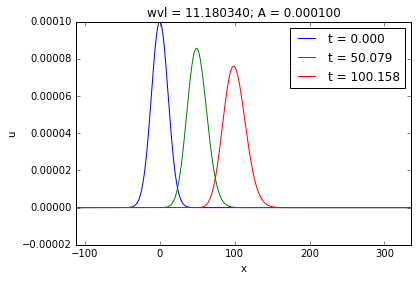

In [8]:
nt = tall.size
gF.saveSnapshots([0,nt/2,-1],x,uall,tall,r'x',r'u',r'wvl = %f; A = %f' %(wvl,A),"figures/KdVTestCases/scott1")

*** Wave info : ***
Amplitude : 0.000100
Wavelength : 7.071068
1/(2.*Wavelength^2) : 0.010000
h0min : 0.150000
h0max : 0.112540
eps : 0.001000
B : 0.100000
alpha^2 : 0.002872
Space steps : 500

*** Computing solution ...
(100, 42.418519514515694)
(200, 84.838117365503862)
*** End of computation ***
*** Plotting animation ...



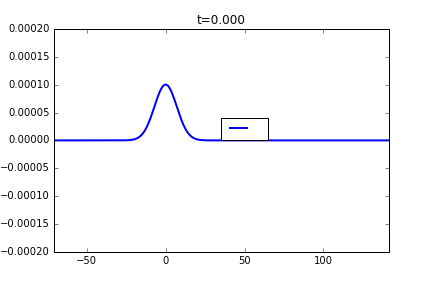
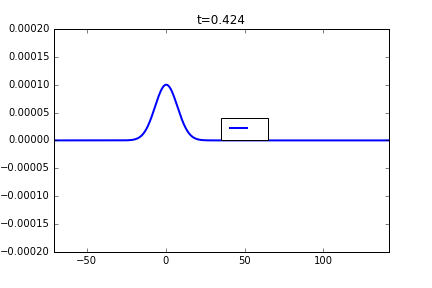
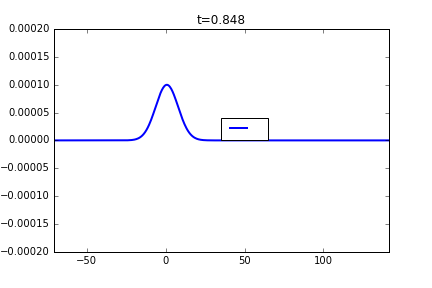
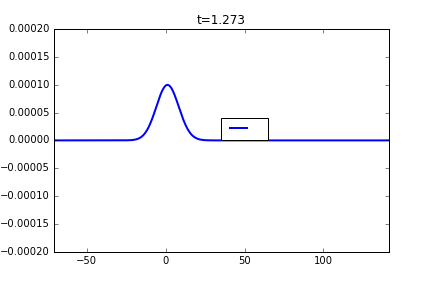
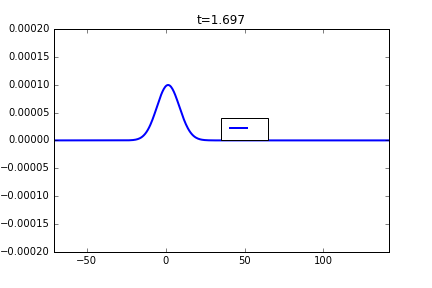
...
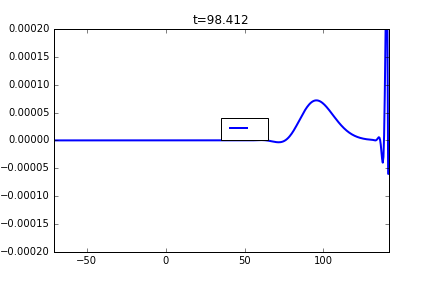
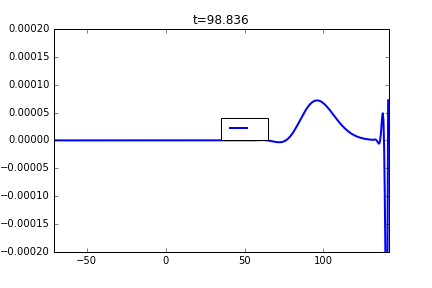
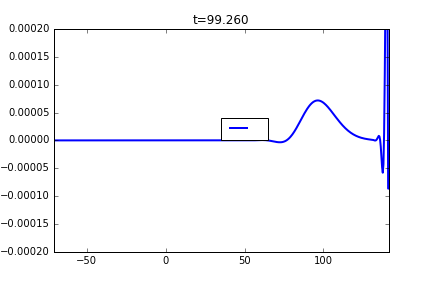
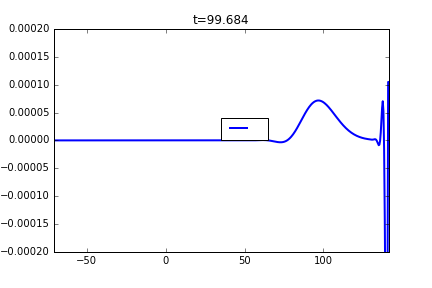
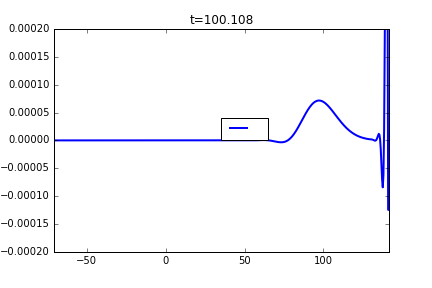

In [9]:
### Wave 2 (Scott example - less long wave)
eps = 0.001
B = 0.1
A = .0001
wvl = np.sqrt(.5/0.01)
h0min = 1.5*A/eps
h0max = B*wvl/(2.*np.pi)
h0 = 0.5*(h0min+h0max)
alpha2 = h0*h0/6.

L = 10.*wvl
xmin = -L
xmax = 2.*L
N = 500
dx = (xmax-xmin)/N
x = kdv.discretizeSpace(xmin,xmax,dx)

kdv.showWaveInfo(A,wvl,B,eps,xmin,xmax,N)

u = np.zeros_like(x)
u = A*np.exp(-(x-0.)**2/(2.*wvl*wvl))
BC=np.array([0.,0.,nan,nan,nan,0.,nan,nan,0.,0.,0.])
uall, tall = kdv.runRk4FVFourier(x,u,t0=0,tmax=100,a=1,b=1, periodic=0, bc=BC)

gF.plotAnimationNSolutions(1,x,np.array([uall]),tall,xmin,xmax,-2.*A,2.*A,[" "],r'$u$')

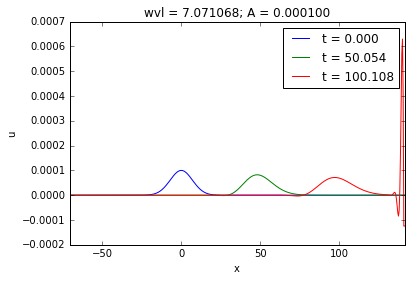

In [10]:
nt = tall.size
gF.saveSnapshots([0,nt/2,-1],x,uall,tall,r'x',r'u',r'wvl = %f; A = %f' %(wvl,A),"figures/KdVTestCases/scott2")

In [106]:
### Wave 3 (Scott example - shorter wave)
eps = 0.001
B = 0.1
A = .00010
wvl = np.sqrt(.5/.1)
h0min = 1.5*A/eps
h0max = B*wvl/(2.*np.pi)
h0 = 0.5*(h0min+h0max)
alpha2 = h0*h0/6.

L = 15.*wvl
xmin = -L
xmax = L
N = 200
dx = (xmax-xmin)/N
x = kdv.discretizeSpace(xmin,xmax,dx)

kdv.showWaveInfo(A,wvl,B,eps,xmin,xmax,N)
print (h0*h0/A/wvl)
u = np.zeros_like(x)
u = A*np.exp(-(x-0.)**2/(2.*wvl*wvl))
BC=np.array([0.,0.,nan,nan,nan,0.,nan,nan,0.,0.])
uall, tall = kdv.runRk4FVFourier(x,u,t0=0,tmax=10,a=1,b=1,periodic=0,bc=BC)

gF.plotAnimationNSolutions(1,x,np.array([uall]),tall,xmin,xmax,-2.*A,2.*A,[" "],r'$u$')

*** Wave info : ***
Amplitude : 0.000100
Wavelength : 2.236068
1/(2.*Wavelength^2) : 0.100000
h0min : 0.150000
h0max : 0.035588
eps : 0.001000
B : 0.100000
alpha^2 : 0.001435
Space steps : 200
38.5083920674

*** Computing solution ...
*** End of computation ***
*** Plotting animation ...


KeyboardInterrupt: 

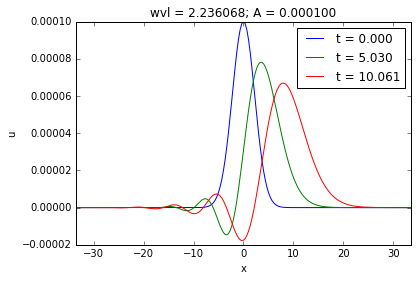

In [12]:
nt = tall.size
gF.saveSnapshots([0,nt/2,-1],x,uall,tall,r'x',r'u',r'wvl = %f; A = %f' %(wvl,A),"figures/KdVTestCases/scott3")

*** Wave info : ***
Amplitude : 1.000000
Wavelength : 25000.000000
1/(2.*Wavelength^2) : 0.000000
h0min : 1500.000000
h0max : 397.887358
eps : 0.001000
B : 0.100000
alpha^2 : 150082.350943
Space steps : 1000

*** Computing solution ...
(100, 21041.097878834305)
(200, 42611.329649095875)
(300, 65654.931061689407)
(400, 90571.776694637898)
*** End of computation ***
*** Plotting animation ...



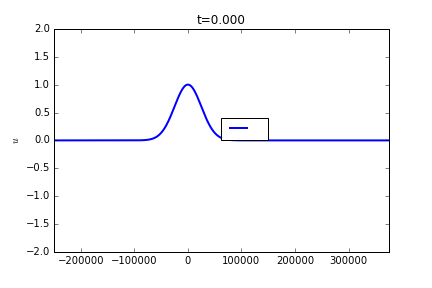
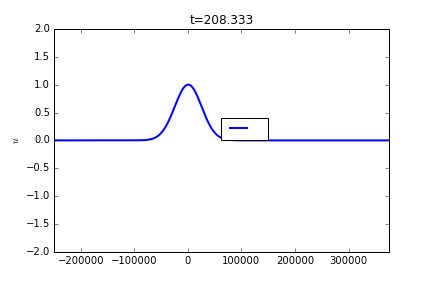
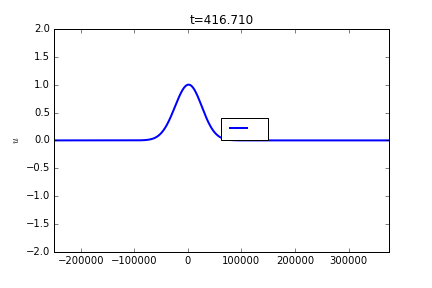
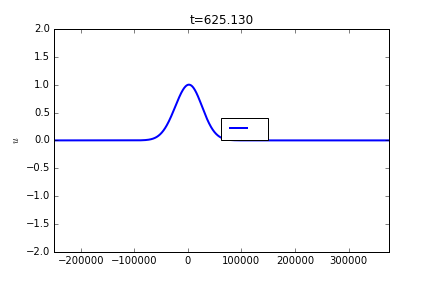
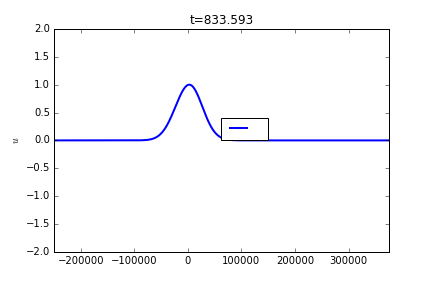
...
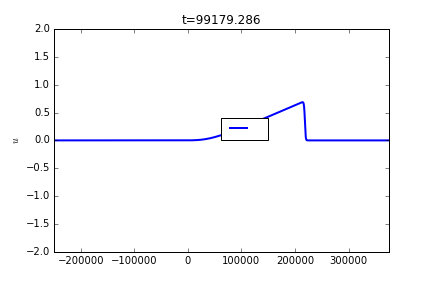
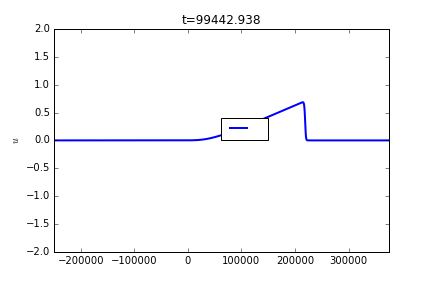
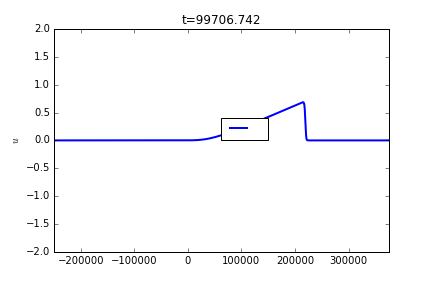
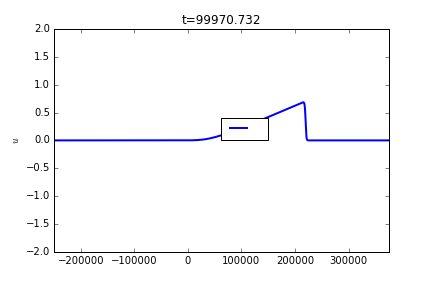
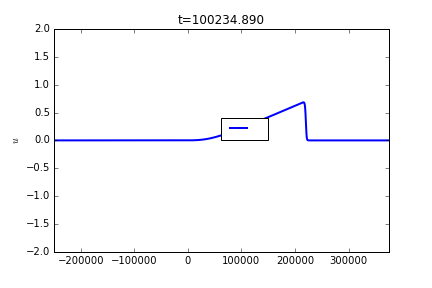

In [13]:
### Wave 4  (Scott example - typical wave)
eps = 0.001
B = 0.1
A = 1.
wvl = 25000.
h0min = 1.5*A/eps
h0max = B*wvl/(2.*np.pi)
h0 = 0.5*(h0min+h0max)
alpha2 = h0*h0/6.

L = 10.*wvl
xmin = -L
xmax = 1.5*L
N = 1000
dx = (xmax-xmin)/N
x = kdv.discretizeSpace(xmin,xmax,dx)

kdv.showWaveInfo(A,wvl,B,eps,xmin,xmax,N)

u = np.zeros_like(x)
u = A*np.exp(-(x-0.)**2/(2.*wvl*wvl))
BC=np.array([0.,0.,nan,nan,0.,nan,nan,nan,0,0])
uall, tall = kdv.runRk4FVFourier(x,u,t0=0,tmax=100000,a=1,b=1,periodic=0,bc=BC)

gF.plotAnimationNSolutions(1,x,np.array([uall]),tall,xmin,xmax,-2.*A,2.*A,[" "],r'$u$')

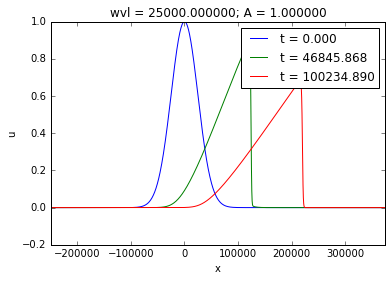

In [14]:
nt = tall.size
gF.saveSnapshots([0,nt/2,-1],x,uall,tall,r'x',r'u',r'wvl = %f; A = %f' %(wvl,A),"figures/KdVTestCases/scottTypical")

#### More simulations : valid waves according to te criteria

In [105]:
### Wave 5  (very very long wave)
eps = 0.001
B = 0.1
A = .1
wvl = 250000.
h0min = 1.5*A/eps
h0max = B*wvl/(2.*np.pi)
h0 = 0.5*(h0min+h0max)
alpha2 = h0*h0/6.

L = 10.*wvl
xmin = -L
xmax = 1.5*L
N = 1000
dx = (xmax-xmin)/N
x = kdv.discretizeSpace(xmin,xmax,dx)

kdv.showWaveInfo(A,wvl,B,eps,xmin,xmax,N)
print (h0*h0/A/wvl)
u = np.zeros_like(x)
u = A*np.exp(-(x-0.)**2/(2.*wvl*wvl))
BC=np.array([0.,0.,nan,nan,0.,nan,nan,nan,0,0])
uall, tall = kdv.runRk4FVFourier(x,u,t0=0,tmax=1000000,a=1,b=1,periodic=0,bc=BC)


*** Wave info : ***
Amplitude : 0.100000
Wavelength : 250000.000000
1/(2.*Wavelength^2) : 0.000000
h0min : 150.000000
h0max : 3978.873577
eps : 0.001000
B : 0.100000
alpha^2 : 710316.542388
Space steps : 1000
170.475970173

*** Computing solution ...


KeyboardInterrupt: 

*** Wave info : ***
Amplitude : 0.100000
Wavelength : 250000.000000
1/(2.*Wavelength^2) : 0.000000
h0min : 150.000000
h0max : 3978.873577
eps : 0.001000
B : 0.100000
alpha^2 : 710316.542388
Space steps : 1000

*** Computing solution ...
(100, 522133.17843757855)
*** End of computation ***
*** Plotting animation ...



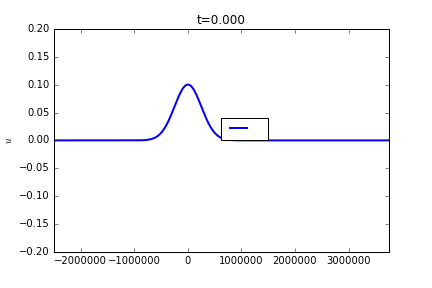
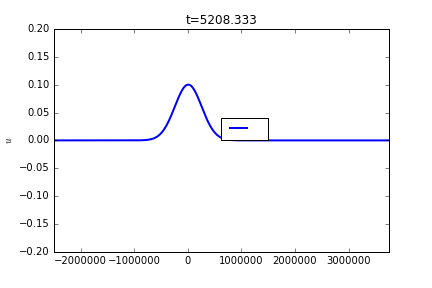
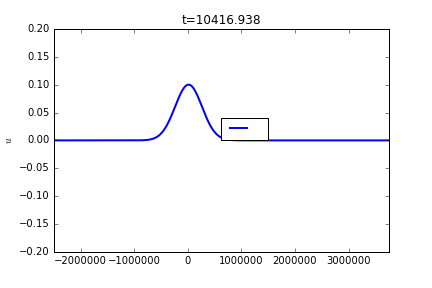
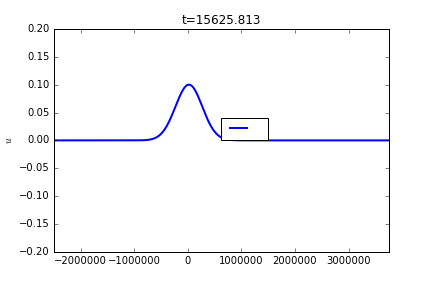
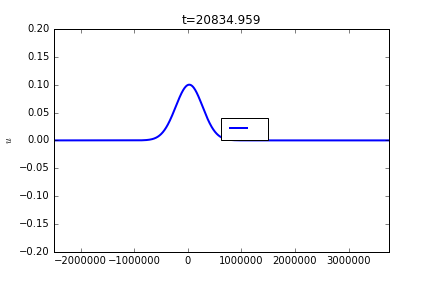
...
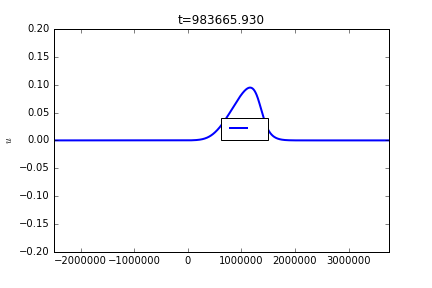
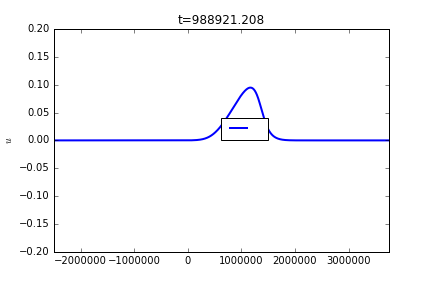
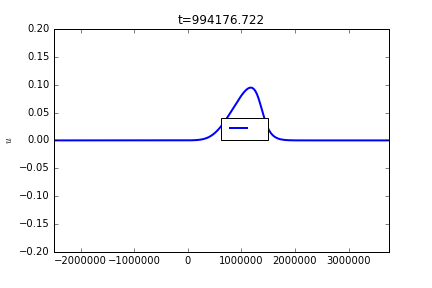
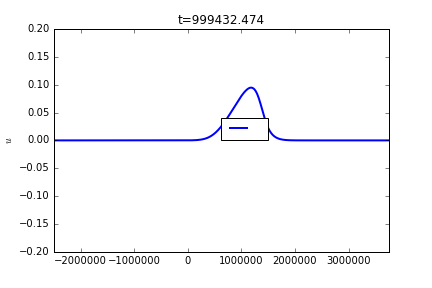
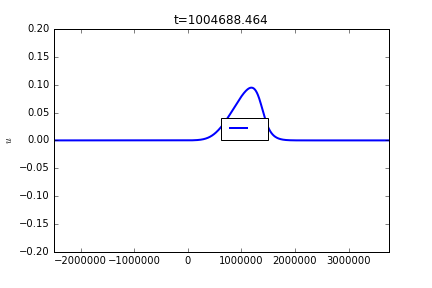

In [15]:
gF.plotAnimationNSolutions(1,x,np.array([uall]),tall,xmin,xmax,-2.*A,2.*A,[" "],r'$u$')

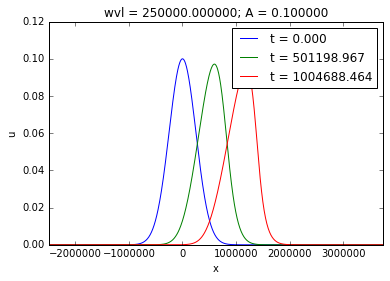

In [16]:
nt = tall.size
gF.saveSnapshots([0,nt/2,-1],x,uall,tall,r'x',r'u',r'wvl = %f; A = %f' %(wvl,A),"figures/KdVTestCases/criteria5")

In [103]:
### Wave 6  (short wave)
eps = 0.001
B = 0.1
A = .00001
wvl = 1.
h0min = 1.5*A/eps
h0max = B*wvl/(2.*np.pi)
h0 = 0.5*(h0min+h0max)
alpha2 = h0*h0/6.

L = 20.*wvl
xmin = -1.5*L
xmax = 1*L
N = 1000
dx = (xmax-xmin)/N
x = kdv.discretizeSpace(xmin,xmax,dx)

kdv.showWaveInfo(A,wvl,B,eps,xmin,xmax,N)

u = np.zeros_like(x)
u = A*np.exp(-(x-0.)**2/(2.*wvl*wvl))
BC=np.array([0.,0.,nan,nan,0.,nan,nan,nan,0,0])
uall, tall = kdv.runRk4FVFourier(x,u,t0=0,tmax=2,a=1,b=1,periodic=0,bc=BC)

print (h0*h0/A/wvl)

*** Wave info : ***
Amplitude : 0.000010
Wavelength : 1.000000
1/(2.*Wavelength^2) : 0.500000
h0min : 0.015000
h0max : 0.015915
eps : 0.001000
B : 0.100000
alpha^2 : 0.000040
Space steps : 1000

*** Computing solution ...
*** End of computation ***
23.8941947095


In [102]:
gF.plotAnimationNSolutions(1,x,np.array([uall]),tall,xmin,xmax,-2.*A,2.*A,[" "],r'$u$')

*** Wave info : ***
Amplitude : 0.000010
Wavelength : 1.000000
1/(2.*Wavelength^2) : 0.500000
h0min : 0.015000
h0max : 0.015915
eps : 0.001000
B : 0.100000
alpha^2 : 0.000040
Space steps : 1000

*** Computing solution ...


KeyboardInterrupt: 

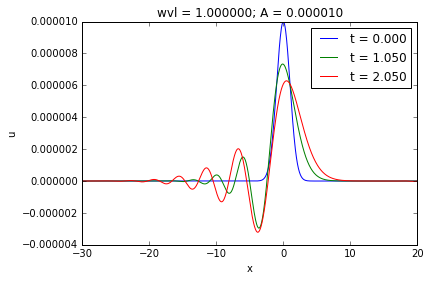

In [18]:
nt = tall.size
gF.saveSnapshots([0,nt/2,-1],x,uall,tall,r'x',r'u',r'wvl = %f; A = %f' %(wvl,A),"figures/KdVTestCases/criteria6")

In [101]:
### Wave 7  (less short wave)
eps = 0.001
B = 0.1
A = .0001
wvl = 10
h0min = 1.5*A/eps
h0max = B*wvl/(2.*np.pi)
h0 = 0.5*(h0min+h0max)
alpha2 = h0*h0/6.

L = 50.*wvl
xmin = -L
xmax = L
N = 1000
dx = (xmax-xmin)/N
x = kdv.discretizeSpace(xmin,xmax,dx)

kdv.showWaveInfo(A,wvl,B,eps,xmin,xmax,N)

u = np.zeros_like(x)
u = A*np.exp(-(x-0.)**2/(2.*wvl*wvl))
BC=np.array([0.,0.,nan,nan,0.,nan,nan,nan,0,0])
uall, tall = kdv.runRk4FVFourier(x,u,t0=0,tmax=100.,a=1,b=1,periodic=0,bc=BC)

*** Wave info : ***
Amplitude : 0.000100
Wavelength : 10.000000
1/(2.*Wavelength^2) : 0.005000
h0min : 0.150000
h0max : 0.159155
eps : 0.001000
B : 0.100000
alpha^2 : 0.003982
Space steps : 1000

*** Computing solution ...
(100, 99.983348555147927)


KeyboardInterrupt: 

In [ ]:
gF.plotAnimationNSolutions(1,x,np.array([uall]),tall,xmin,xmax,-2.*A,2.*A,[" "],r'$u$')

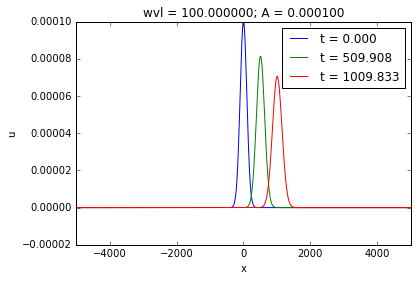

In [100]:
nt = tall.size
gF.saveSnapshots([0,nt/2,-1],x,uall,tall,r'x',r'u',r'wvl = %f; A = %f' %(wvl,A),"figures/KdVTestCases/criteria7")

*** Wave info : ***
Amplitude : 0.000000
Wavelength : 10000.000000
1/(2.*Wavelength^2) : 0.000000
h0min : 0.000002
h0max : 159.154943
eps : 0.001000
B : 0.100000
alpha^2 : 1055.429016
Space steps : 2000

*** Computing solution ...
(100, 9999.9998800492522)
(200, 19999.999760197032)
*** End of computation ***
*** Plotting animation ...



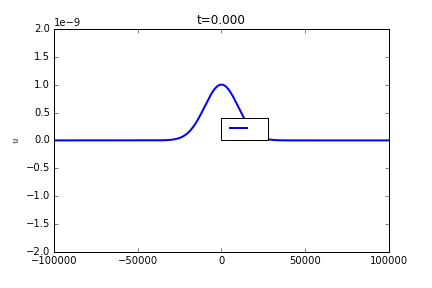
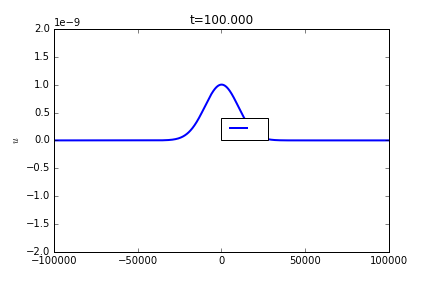
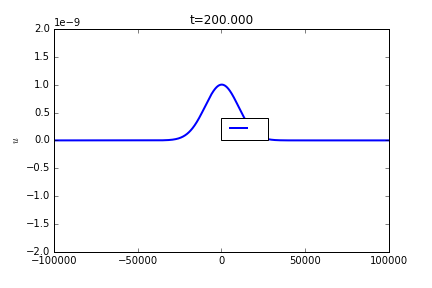
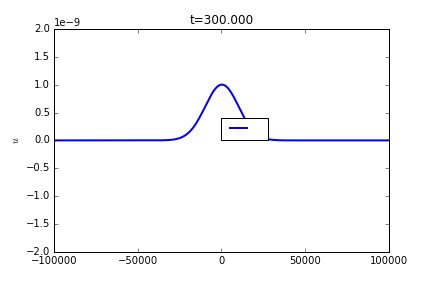
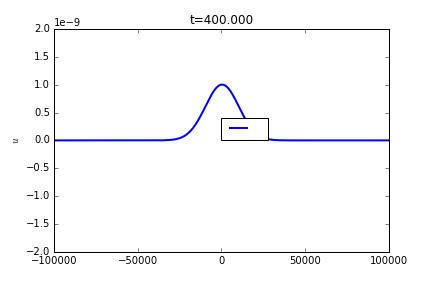
...
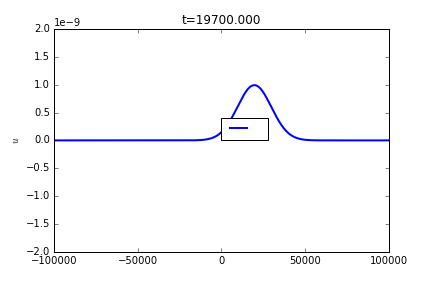
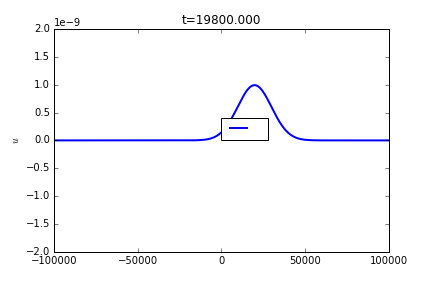
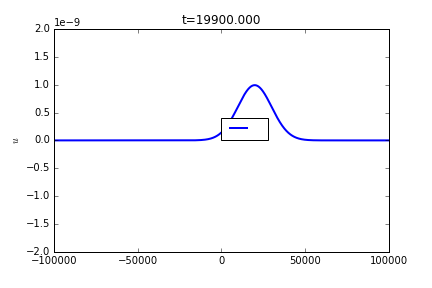
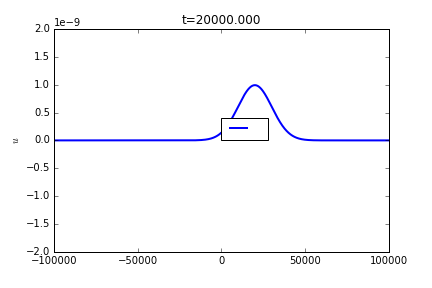
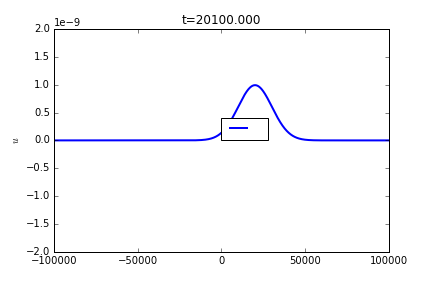

In [21]:
### Wave 8  (very small and long wave)
eps = 0.001
B = 0.1
A = .000000001
wvl = 10000.
h0min = 1.5*A/eps
h0max = B*wvl/(2.*np.pi)
h0 = 0.5*(h0min+h0max)
alpha2 = h0*h0/6.

L = 10.*wvl
xmin = -L
xmax = L
N = 2000
dx = (xmax-xmin)/N
x = kdv.discretizeSpace(xmin,xmax,dx)

kdv.showWaveInfo(A,wvl,B,eps,xmin,xmax,N)

u = np.zeros_like(x)
u = A*np.exp(-(x-0.)**2/(2.*wvl*wvl))
BC=np.array([0.,0.,nan,nan,0.,nan,nan,nan,0,0])
uall, tall = kdv.runRk4FVFourier(x,u,t0=0,tmax=20000,a=1,b=1,periodic=0,bc=BC)

gF.plotAnimationNSolutions(1,x,np.array([uall]),tall,xmin,xmax,-2.*A,2.*A,[" "],r'$u$')

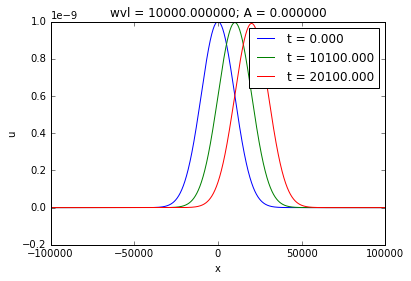

In [22]:
nt = tall.size
gF.saveSnapshots([0,nt/2,-1],x,uall,tall,r'x',r'u',r'wvl = %f; A = %f' %(wvl,A),"figures/KdVTestCases/criteria8")